In [3]:
import torch
import torchvision
import torchvision.transforms as transforms
import numpy as np
import json
import os
from PIL import Image
import matplotlib.pyplot as plt
import scipy.stats as stats

In [4]:
import zipfile
import os

def extract_zip(zip_path, extract_to="./TestData"):
    """
    Extract a zip file to a specified directory
    """
    if not os.path.exists(extract_to):
        os.makedirs(extract_to)

    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)

    print(f"Extracted {zip_path} to {extract_to}")

# Example usage:
extract_zip("TestDataSet.zip", "./")

Extracted TestDataSet.zip to ./


In [5]:
with open('./TestDataSet/labels_list.json', 'r') as f:
    labels_list = json.load(f)


imagenet_label_map = {}
for label in labels_list:
    index, name = label.split(': ', 1)
    imagenet_label_map[int(index)] = name


dataset_to_imagenet = {}
imagenet_to_dataset = {}
for i, label in enumerate(labels_list):
    index, name = label.split(': ', 1)
    dataset_to_imagenet[i] = int(index)
    imagenet_to_dataset[int(index)] = i

print("Mapping created:")
print("Dataset index 0 maps to ImageNet index:", dataset_to_imagenet[0])
print("Dataset index 99 maps to ImageNet index:", dataset_to_imagenet[99])

Mapping created:
Dataset index 0 maps to ImageNet index: 401
Dataset index 99 maps to ImageNet index: 500


In [6]:
pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
pretrained_model.eval()  # Set to evaluation mode


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
pretrained_model = pretrained_model.to(device)
print(f"Using device: {device}")

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 132MB/s]


Using device: cuda


In [7]:
mean_norms = np.array([0.485, 0.456, 0.406])
std_norms = np.array([0.229, 0.224, 0.225])

plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])


dataset_path = "./TestDataSet"
dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=plain_transforms)


test_loader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=False, num_workers=0)

print(f"Test dataset size: {len(dataset)}")
print(f"Number of classes: {len(dataset.classes)}")

Test dataset size: 500
Number of classes: 100


In [8]:
def evaluate_model(model, dataloader, imagenet_label_map, dataset_to_imagenet, k=5):
    """
    Evaluate the model's top-1 and top-k accuracy
    """
    model.eval()
    correct_top1 = 0
    correct_topk = 0
    total = 0

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)


            outputs = model(images)


            _, top_pred = torch.topk(outputs, k, dim=1)


            true_imagenet_labels = torch.tensor([dataset_to_imagenet[label.item()] for label in labels]).to(device)


            correct_top1 += (top_pred[:, 0] == true_imagenet_labels).sum().item()

            # Check top-k accuracy
            for i in range(len(labels)):
                if true_imagenet_labels[i] in top_pred[i]:
                    correct_topk += 1

            total += labels.size(0)


    top1_accuracy = 100 * correct_top1 / total
    topk_accuracy = 100 * correct_topk / total


    print(f"Top-1 Accuracy: {top1_accuracy:.2f}%")
    print(f"Top-{k} Accuracy: {topk_accuracy:.2f}%")

    return top1_accuracy, topk_accuracy


top1_acc, top5_acc = evaluate_model(pretrained_model, test_loader, imagenet_label_map, dataset_to_imagenet, k=5)

Top-1 Accuracy: 76.00%
Top-5 Accuracy: 94.20%


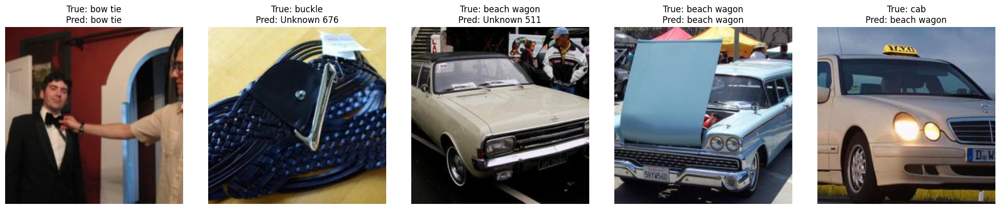

In [9]:
def visualize_predictions(model, dataset, imagenet_label_map, dataset_to_imagenet, num_samples=5):
    """
    Visualize model predictions on sample images with proper index mapping
    """
    model.eval()


    indices = np.random.choice(len(dataset), num_samples, replace=False)

    fig, axes = plt.subplots(1, num_samples, figsize=(4*num_samples, 4))
    if num_samples == 1:
        axes = [axes]

    with torch.no_grad():
        for i, idx in enumerate(indices):

            img, dataset_label = dataset[idx]


            true_imagenet_label = dataset_to_imagenet[dataset_label]


            img_tensor = img.unsqueeze(0).to(device)
            output = model(img_tensor)
            _, predicted = torch.max(output, 1)
            predicted_imagenet_idx = predicted.item()


            img_np = img.permute(1, 2, 0).cpu().numpy()

            img_np = img_np * std_norms + mean_norms
            img_np = np.clip(img_np, 0, 1)


            axes[i].imshow(img_np)
            true_name = imagenet_label_map.get(true_imagenet_label, f"Unknown {true_imagenet_label}")
            pred_name = imagenet_label_map.get(predicted_imagenet_idx, f"Unknown {predicted_imagenet_idx}")

            axes[i].set_title(f"True: {true_name}\nPred: {pred_name}")
            axes[i].axis('off')

    plt.tight_layout()
    plt.show()


visualize_predictions(pretrained_model, dataset, imagenet_label_map, dataset_to_imagenet, num_samples=5)

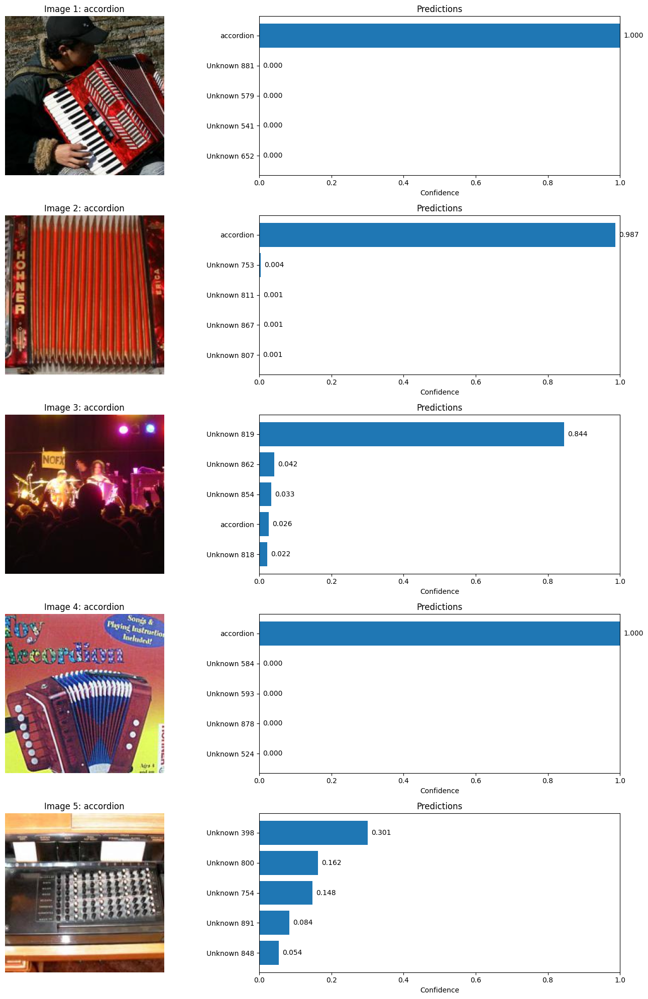

In [10]:
def visualize_predictions_grid(model, dataset, imagenet_label_map, dataset_to_imagenet, num_images=4, top_n=5):
    """
    Visualize top predictions for multiple images in a grid
    """
    model.eval()

    fig = plt.figure(figsize=(15, 4*num_images))

    for img_idx in range(num_images):

        img, dataset_label = dataset[img_idx]


        true_imagenet_label = dataset_to_imagenet[dataset_label]
        true_name = imagenet_label_map[true_imagenet_label]


        img_tensor = img.unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(img_tensor)

            probabilities = torch.nn.functional.softmax(output, dim=1)

            top_probs, top_indices = torch.topk(probabilities, top_n)


        top_probs = top_probs.squeeze().cpu().numpy()
        top_indices = top_indices.squeeze().cpu().numpy()


        class_names = []
        for idx in top_indices:
            name = imagenet_label_map.get(idx, f"Unknown {idx}")
            class_names.append(name)


        ax1 = plt.subplot(num_images, 2, 2*img_idx + 1)
        img_np = img.permute(1, 2, 0).cpu().numpy()

        img_np = img_np * std_norms + mean_norms
        img_np = np.clip(img_np, 0, 1)

        ax1.imshow(img_np)
        ax1.set_title(f'Image {img_idx+1}: {true_name}')
        ax1.axis('off')


        ax2 = plt.subplot(num_images, 2, 2*img_idx + 2)
        y_pos = np.arange(len(class_names))
        bars = ax2.barh(y_pos, top_probs)
        ax2.set_yticks(y_pos)
        ax2.set_yticklabels(class_names)
        ax2.invert_yaxis()  # Labels read top-to-bottom
        ax2.set_xlabel('Confidence')
        ax2.set_xlim(0, 1)
        ax2.set_title('Predictions')


        for i, bar in enumerate(bars):
            width = bar.get_width()
            ax2.text(width + 0.01, bar.get_y() + bar.get_height()/2.,
                    f'{width:.3f}', ha='left', va='center')

    plt.tight_layout()
    plt.show()


visualize_predictions_grid(pretrained_model, dataset, imagenet_label_map, dataset_to_imagenet,
                         num_images=5, top_n=5)

# **Task 2**

In [11]:
def fgsm_attack(model, image, label, epsilon):
    """
    Perform FGSM attack on a single image
    """

    image.requires_grad = True


    output = model(image)


    loss = torch.nn.CrossEntropyLoss()(output, label)


    model.zero_grad()
    loss.backward()


    sign_grad = image.grad.sign()


    perturbed_image = image + epsilon * sign_grad


    return perturbed_image.detach()

In [12]:
def generate_adversarial_dataset(model, dataloader, imagenet_label_map, dataset_to_imagenet, epsilon=0.02):
    """
    Generate adversarial examples for the entire dataset
    """
    model.eval()
    adversarial_images = []
    adversarial_labels = []
    original_images = []

    print("Generating adversarial examples...")
    for batch_idx, (images, labels) in enumerate(dataloader):
        images = images.to(device)
        labels = labels.to(device)


        true_imagenet_labels = torch.tensor([dataset_to_imagenet[label.item()] for label in labels]).to(device)


        batch_adversarial = []
        for i in range(len(images)):
            adv_img = fgsm_attack(model, images[i:i+1], true_imagenet_labels[i:i+1], epsilon)
            batch_adversarial.append(adv_img.squeeze(0))


        adversarial_images.extend(batch_adversarial)
        adversarial_labels.extend(true_imagenet_labels.cpu().numpy())
        original_images.extend(images.cpu())

        if batch_idx % 5 == 0:
            print(f"Processed {batch_idx}/{len(dataloader)} batches")

    return adversarial_images, adversarial_labels, original_images


epsilon = 0.02
adv_images, adv_labels, orig_images = generate_adversarial_dataset(
    pretrained_model, test_loader, imagenet_label_map, dataset_to_imagenet, epsilon
)

Generating adversarial examples...
Processed 0/16 batches
Processed 5/16 batches
Processed 10/16 batches
Processed 15/16 batches


In [13]:
from torch.utils.data import Dataset

class AdversarialDataset(Dataset):
    def __init__(self, images, labels):
        self.images = images
        self.labels = labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.labels[idx]


adv_dataset = AdversarialDataset(adv_images, adv_labels)
adv_loader = torch.utils.data.DataLoader(adv_dataset, batch_size=32, shuffle=False)


Successful Attack 1:


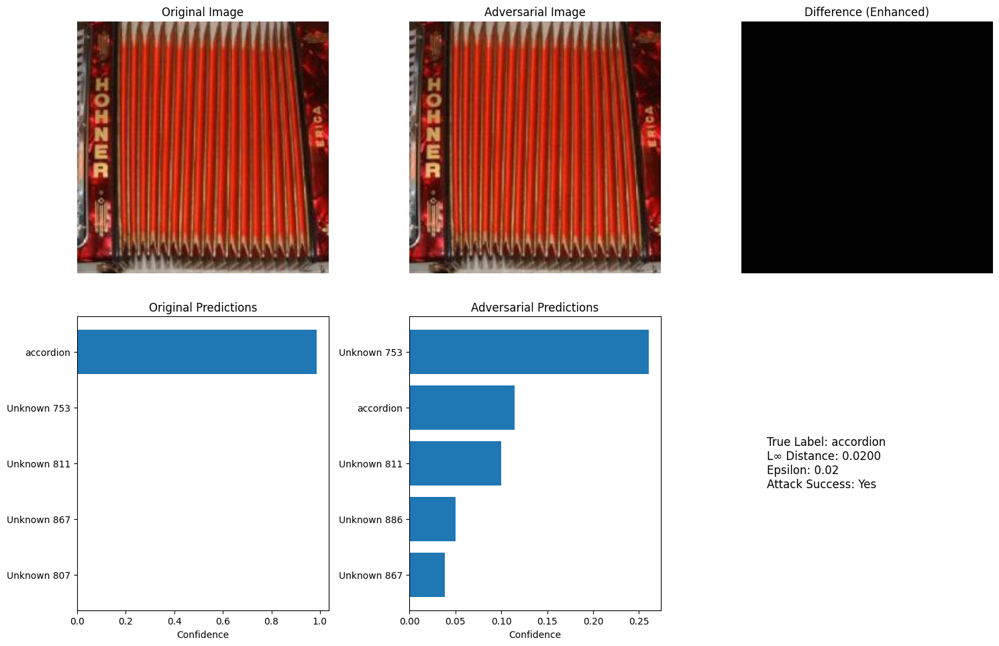


Successful Attack 2:


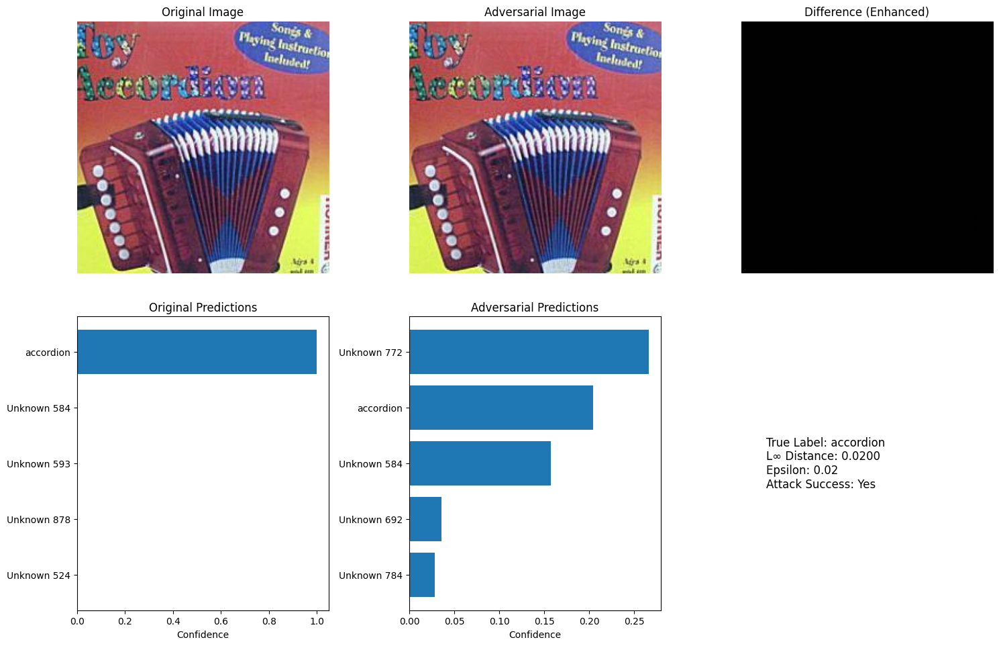


Successful Attack 3:


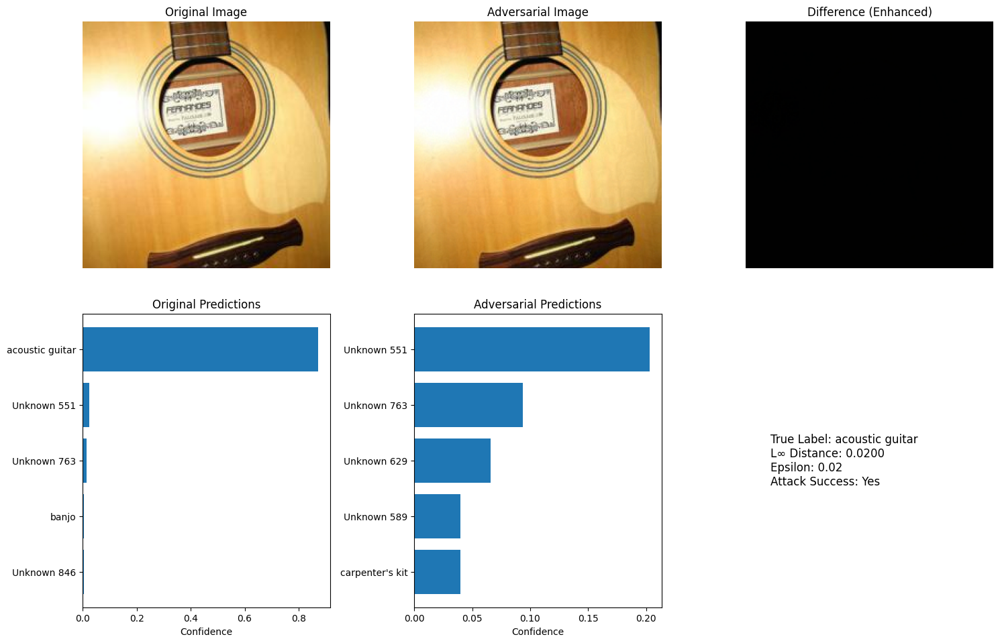


Successful Attack 4:


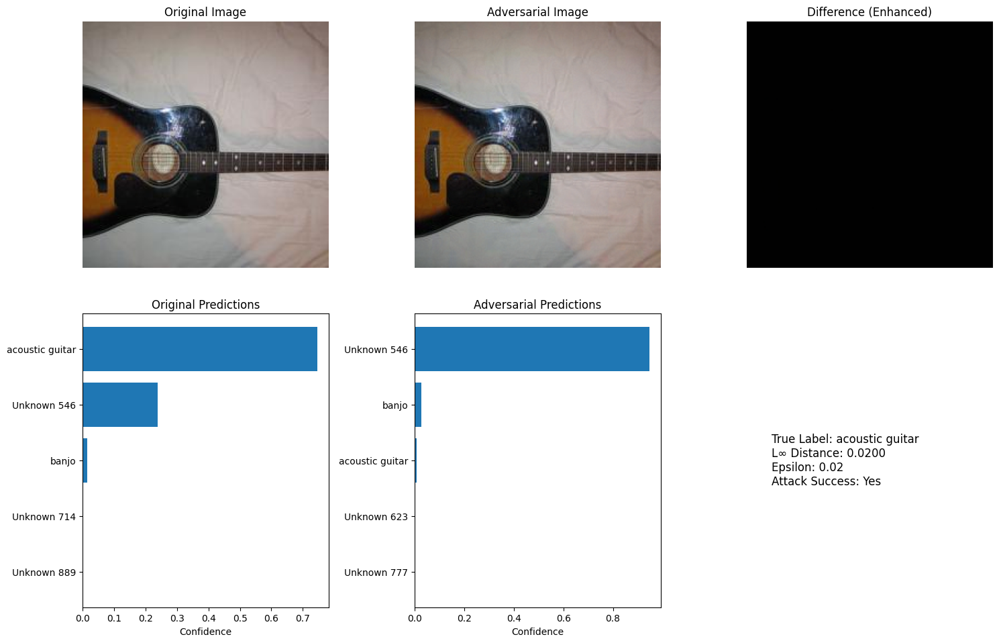


Successful Attack 5:


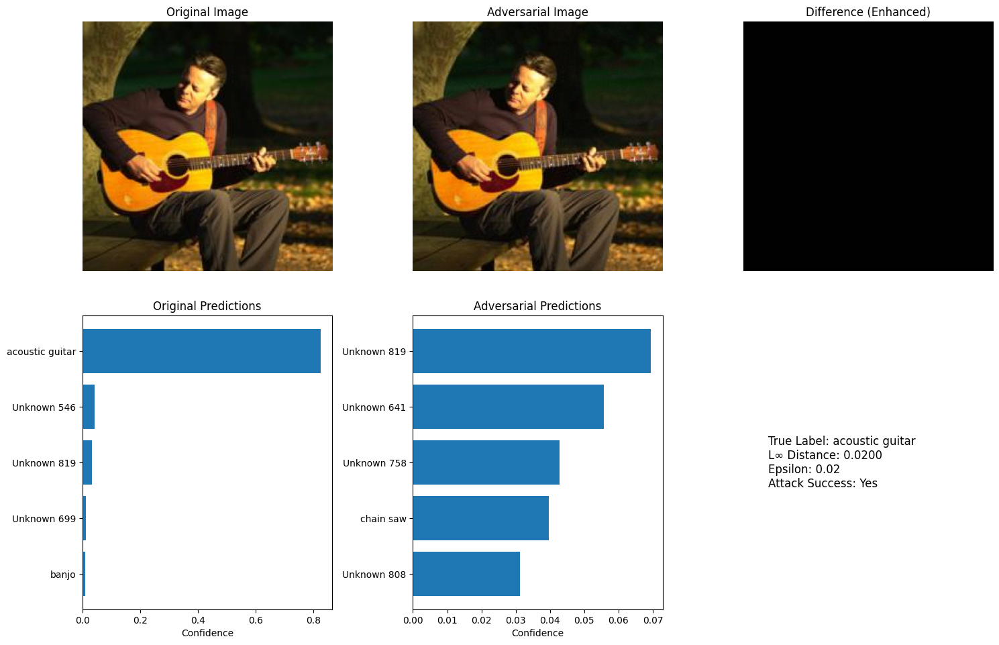

In [14]:
def visualize_fgsm_attack(original_image, adversarial_image, true_label, model, imagenet_label_map):
    """
    Visualize original vs adversarial image with predictions
    """
    model.eval()


    orig_input = original_image.unsqueeze(0).to(device)
    adv_input = adversarial_image.unsqueeze(0).to(device)


    with torch.no_grad():
        orig_output = model(orig_input)
        orig_prob = torch.nn.functional.softmax(orig_output, dim=1)
        orig_top5_prob, orig_top5_idx = torch.topk(orig_prob, 5)


    with torch.no_grad():
        adv_output = model(adv_input)
        adv_prob = torch.nn.functional.softmax(adv_output, dim=1)
        adv_top5_prob, adv_top5_idx = torch.topk(adv_prob, 5)


    orig_img_np = original_image.permute(1, 2, 0).cpu().numpy()
    adv_img_np = adversarial_image.permute(1, 2, 0).cpu().numpy()


    orig_img_np = orig_img_np * std_norms + mean_norms
    adv_img_np = adv_img_np * std_norms + mean_norms
    orig_img_np = np.clip(orig_img_np, 0, 1)
    adv_img_np = np.clip(adv_img_np, 0, 1)


    fig, axes = plt.subplots(2, 3, figsize=(15, 10))


    axes[0,0].imshow(orig_img_np)
    axes[0,0].set_title('Original Image')
    axes[0,0].axis('off')


    axes[0,1].imshow(adv_img_np)
    axes[0,1].set_title('Adversarial Image')
    axes[0,1].axis('off')


    diff = np.abs(adv_img_np - orig_img_np)
    axes[0,2].imshow(diff)
    axes[0,2].set_title('Difference (Enhanced)')
    axes[0,2].axis('off')


    axes[1,0].barh(range(5), orig_top5_prob.squeeze().cpu().numpy())
    axes[1,0].set_yticks(range(5))
    axes[1,0].set_yticklabels([imagenet_label_map.get(idx.item(), f"Unknown {idx.item()}")
                               for idx in orig_top5_idx.squeeze()])
    axes[1,0].set_xlabel('Confidence')
    axes[1,0].set_title('Original Predictions')
    axes[1,0].invert_yaxis()


    axes[1,1].barh(range(5), adv_top5_prob.squeeze().cpu().numpy())
    axes[1,1].set_yticks(range(5))
    axes[1,1].set_yticklabels([imagenet_label_map.get(idx.item(), f"Unknown {idx.item()}")
                               for idx in adv_top5_idx.squeeze()])
    axes[1,1].set_xlabel('Confidence')
    axes[1,1].set_title('Adversarial Predictions')
    axes[1,1].invert_yaxis()


    true_name = imagenet_label_map.get(true_label.item(), f"Unknown {true_label.item()}")
    l_inf_dist = torch.max(torch.abs(adversarial_image - original_image)).item()

    info_text = f"True Label: {true_name}\n"
    info_text += f"L∞ Distance: {l_inf_dist:.4f}\n"
    info_text += f"Epsilon: {epsilon}\n"
    info_text += f"Attack Success: {'Yes' if orig_top5_idx[0,0] != adv_top5_idx[0,0] else 'No'}"

    axes[1,2].text(0.1, 0.5, info_text, transform=axes[1,2].transAxes, fontsize=12,
                   verticalalignment='center')
    axes[1,2].axis('off')

    plt.tight_layout()
    plt.show()


successful_attacks = 0
for i in range(len(adv_images)):
    if successful_attacks >= 5:
        break


    with torch.no_grad():
        orig_pred = pretrained_model(orig_images[i].unsqueeze(0).to(device)).argmax(dim=1)
        adv_pred = pretrained_model(adv_images[i].to(device).unsqueeze(0)).argmax(dim=1)

    if orig_pred != adv_pred:
        successful_attacks += 1
        print(f"\nSuccessful Attack {successful_attacks}:")

        visualize_fgsm_attack(orig_images[i], adv_images[i].cpu(),
                            torch.tensor(adv_labels[i]), pretrained_model, imagenet_label_map)

In [15]:
def evaluate_adversarial_performance(model, adv_loader, imagenet_label_map, k=5):
    """
    Evaluate model performance on adversarial images
    """
    model.eval()
    correct_top1 = 0
    correct_topk = 0
    total = 0

    with torch.no_grad():
        for images, labels in adv_loader:
            images = images.to(device)
            labels = labels.to(device)


            outputs = model(images)


            _, top_pred = torch.topk(outputs, k, dim=1)


            correct_top1 += (top_pred[:, 0] == labels).sum().item()


            for i in range(len(labels)):
                if labels[i] in top_pred[i]:
                    correct_topk += 1

            total += labels.size(0)


    top1_accuracy = 100 * correct_top1 / total
    topk_accuracy = 100 * correct_topk / total

    print(f"\nAdversarial Performance:")
    print(f"Top-1 Accuracy: {top1_accuracy:.2f}%")
    print(f"Top-{k} Accuracy: {topk_accuracy:.2f}%")

    return top1_accuracy, topk_accuracy


adv_top1, adv_top5 = evaluate_adversarial_performance(pretrained_model, adv_loader, imagenet_label_map, k=5)


print(f"\nAccuracy Drop:")
print(f"Top-1: {top1_acc:.2f}% → {adv_top1:.2f}% (Drop: {top1_acc - adv_top1:.2f}%)")
print(f"Top-5: {top5_acc:.2f}% → {adv_top5:.2f}% (Drop: {top5_acc - adv_top5:.2f}%)")


Adversarial Performance:
Top-1 Accuracy: 6.00%
Top-5 Accuracy: 35.40%

Accuracy Drop:
Top-1: 76.00% → 6.00% (Drop: 70.00%)
Top-5: 94.20% → 35.40% (Drop: 58.80%)


In [16]:
# Save adversarial dataset
import os

def save_adversarial_dataset(adv_images, adv_labels, path="./AdversarialTestSet1"):
    """
    Save adversarial images to disk
    """
    if not os.path.exists(path):
        os.makedirs(path)

    # Save images and labels
    torch.save({'images': adv_images, 'labels': adv_labels},
               os.path.join(path, 'adversarial_data.pt'))

    print(f"Adversarial dataset saved to {path}")

# Save the dataset
save_adversarial_dataset(adv_images, adv_labels, "./AdversarialTestSet1")

Adversarial dataset saved to ./AdversarialTestSet1


In [17]:
def verify_l_inf_constraint(original_images, adversarial_images, epsilon):
    """
    Verify that all adversarial examples satisfy L∞ constraint
    Rounds to 5 decimal places before comparison
    """
    max_diffs = []
    violations = []

    for i, (orig, adv) in enumerate(zip(original_images, adversarial_images)):
        l_inf_dist = torch.max(torch.abs(adv.cpu() - orig.cpu())).item()
        l_inf_rounded = round(l_inf_dist, 5)
        max_diffs.append(l_inf_rounded)

        if l_inf_rounded > epsilon:
            violations.append((i, l_inf_rounded))

    max_l_inf = max(max_diffs)
    avg_l_inf = sum(max_diffs) / len(max_diffs)

    print(f"\nL∞ Constraint Verification :")
    print(f"Maximum L∞ distance: {max_l_inf:.5f}")
    print(f"Average L∞ distance: {avg_l_inf:.5f}")
    print(f"Epsilon constraint: {epsilon}")



verify_l_inf_constraint(orig_images, adv_images, epsilon)


L∞ Constraint Verification :
Maximum L∞ distance: 0.02000
Average L∞ distance: 0.02000
Epsilon constraint: 0.02


# **Task 3**

# **Iterative FGSM Attack Function**

In [18]:
def iterative_fgsm_attack(model, image, label, epsilon, alpha, iters):
    """
    Perform Iterative FGSM (I-FGSM) attack under L∞ constraint
    """
    ori_image = image.clone().detach()
    image = image.clone().detach().to(device)
    label = label.to(device)

    for _ in range(iters):
        image = image.detach().requires_grad_()
        output = model(image)
        loss = torch.nn.CrossEntropyLoss()(output, label)
        model.zero_grad()
        loss.backward()

        grad_sign = image.grad.sign()
        image = image + alpha * grad_sign

        # Project back to epsilon-ball
        image = torch.max(torch.min(image, ori_image + epsilon), ori_image - epsilon)

        # Clamp to normalized pixel range
        image = torch.clamp(image, -2.1179, 2.6400)

    return image.detach()

# **Dataset Generation Using I-FGSM**

In [19]:
def generate_iterative_adversarial_dataset(model, dataloader, imagenet_label_map, dataset_to_imagenet, epsilon=0.02, alpha=0.004, iters=5):
    model.eval()
    adv_images = []
    adv_labels = []
    original_images = []

    print("Generating adversarial examples using Iterative FGSM...")
    for batch_idx, (images, labels) in enumerate(dataloader):
        images = images.to(device)
        labels = labels.to(device)

        true_imagenet_labels = torch.tensor([dataset_to_imagenet[label.item()] for label in labels]).to(device)

        batch_adv = []
        for i in range(len(images)):
            adv_img = iterative_fgsm_attack(model, images[i:i+1], true_imagenet_labels[i:i+1],
                                            epsilon, alpha, iters)
            batch_adv.append(adv_img.squeeze(0))

        adv_images.extend(batch_adv)
        adv_labels.extend(true_imagenet_labels.cpu().numpy())
        original_images.extend(images.cpu())

        if batch_idx % 5 == 0:
            print(f"Processed {batch_idx}/{len(dataloader)} batches")

    return adv_images, adv_labels, original_images

In [20]:
# Run the I-FGSM attack to generate Adversarial Test Set 2
adv_images2, adv_labels2, orig_images2 = generate_iterative_adversarial_dataset(
    pretrained_model,
    test_loader,
    imagenet_label_map,
    dataset_to_imagenet,
    epsilon=0.02,
    alpha=0.004,
    iters=5
)

Generating adversarial examples using Iterative FGSM...
Processed 0/16 batches
Processed 5/16 batches
Processed 10/16 batches
Processed 15/16 batches


# **Wrap Dataset & Evaluate Performance**

In [21]:
# Wrap dataset
adv_dataset2 = AdversarialDataset(adv_images2, adv_labels2)
adv_loader2 = torch.utils.data.DataLoader(adv_dataset2, batch_size=32, shuffle=False)

# Evaluate
adv2_top1, adv2_top5 = evaluate_adversarial_performance(pretrained_model, adv_loader2, imagenet_label_map, k=5)

# Report
print(f"\nI-FGSM Accuracy Drop:")
print(f"Top-1: {top1_acc:.2f}% → {adv2_top1:.2f}% (Drop: {top1_acc - adv2_top1:.2f}%)")
print(f"Top-5: {top5_acc:.2f}% → {adv2_top5:.2f}% (Drop: {top5_acc - adv2_top5:.2f}%)")


Adversarial Performance:
Top-1 Accuracy: 0.20%
Top-5 Accuracy: 14.60%

I-FGSM Accuracy Drop:
Top-1: 76.00% → 0.20% (Drop: 75.80%)
Top-5: 94.20% → 14.60% (Drop: 79.60%)


# **Save & Verify L∞ Constraint**

In [22]:
# Save
save_adversarial_dataset(adv_images2, adv_labels2, "./AdversarialTestSet2")

# Verify constraint
verify_l_inf_constraint(orig_images2, adv_images2, epsilon)

Adversarial dataset saved to ./AdversarialTestSet2

L∞ Constraint Verification :
Maximum L∞ distance: 0.02000
Average L∞ distance: 0.02000
Epsilon constraint: 0.02



I-FGSM Successful Attack 1:


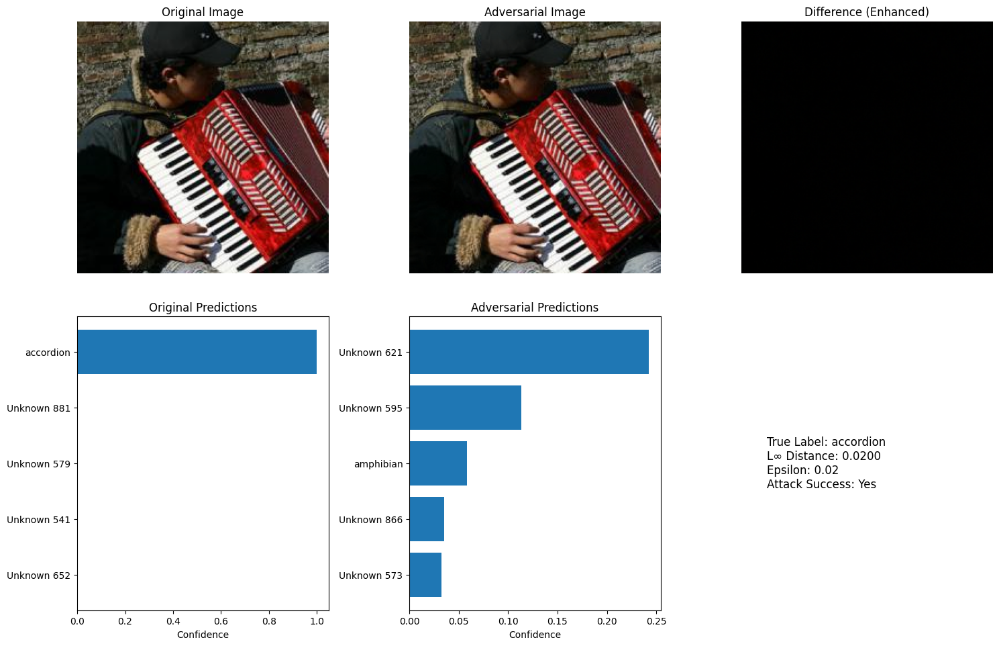


I-FGSM Successful Attack 2:


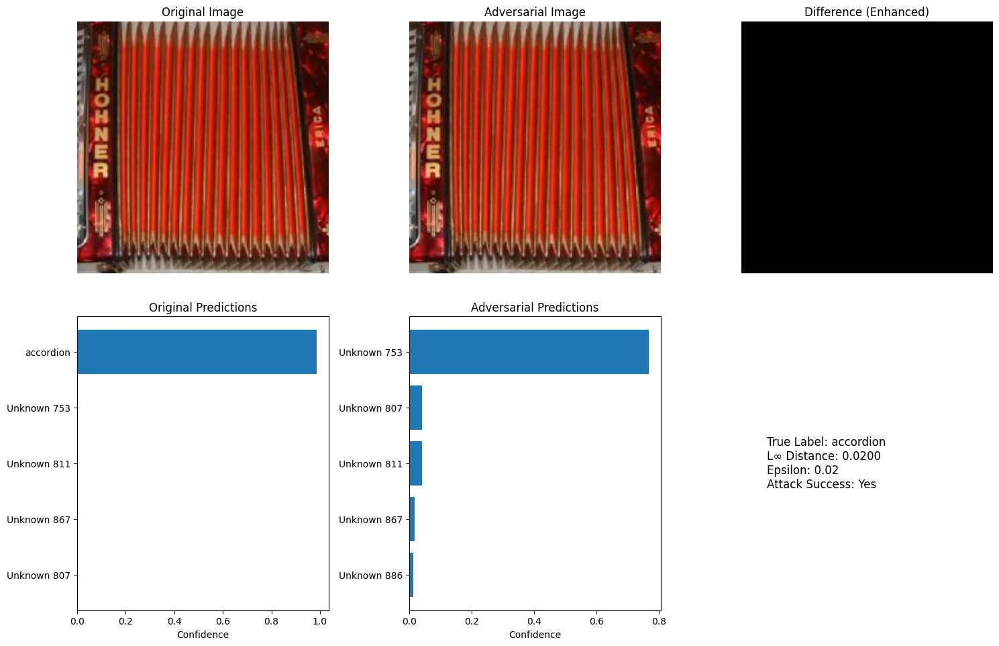


I-FGSM Successful Attack 3:


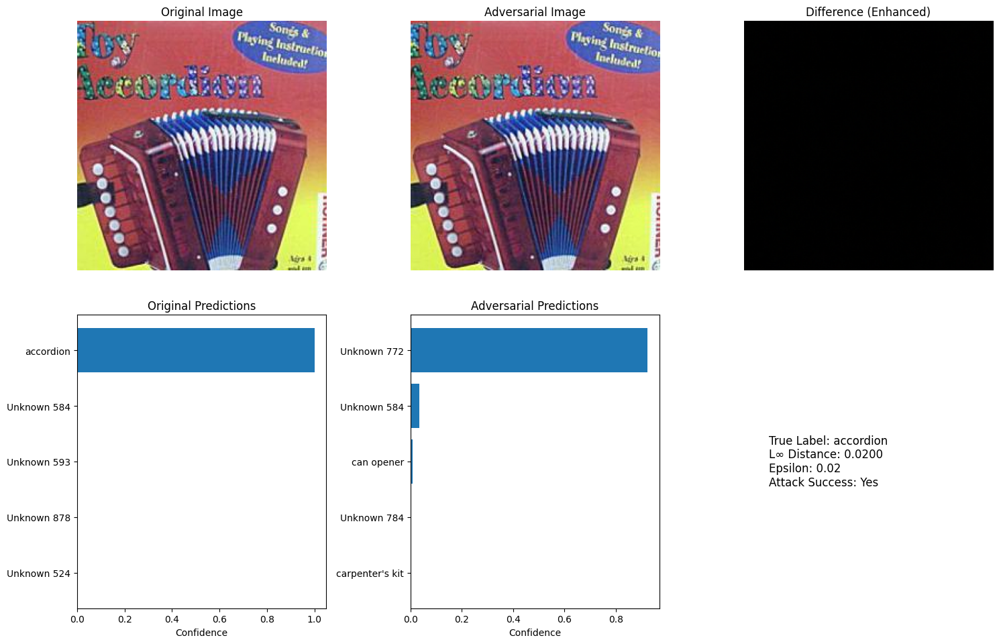


I-FGSM Successful Attack 4:


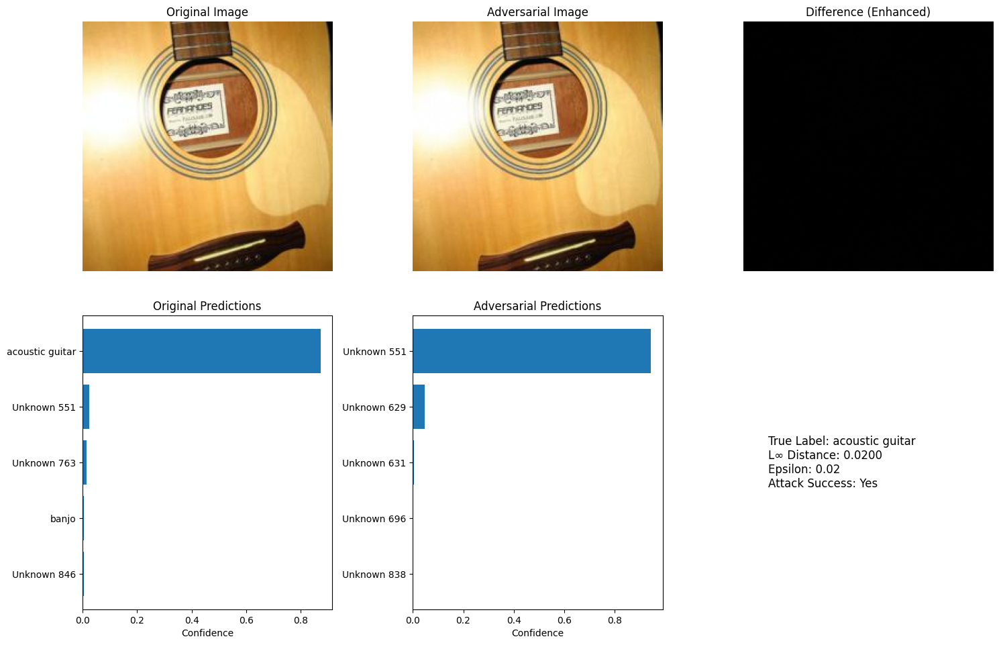


I-FGSM Successful Attack 5:


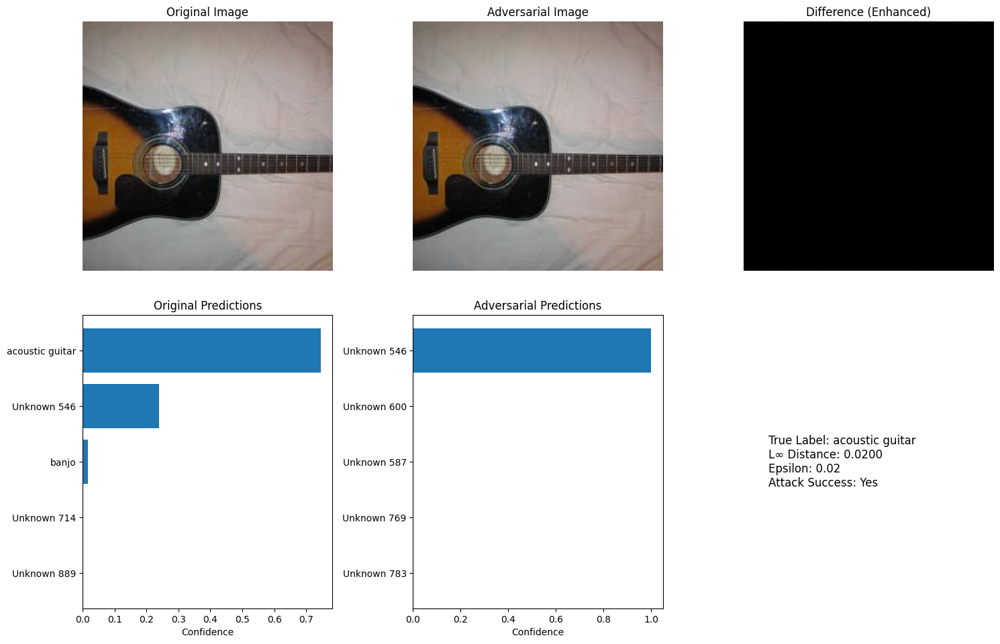

In [23]:
# Visualize up to 5 successful attacks from Adversarial Test Set 2
successful_attacks = 0
for i in range(len(adv_images2)):
    if successful_attacks >= 5:
        break

    with torch.no_grad():
        orig_pred = pretrained_model(orig_images2[i].unsqueeze(0).to(device)).argmax(dim=1)
        adv_pred = pretrained_model(adv_images2[i].unsqueeze(0).to(device)).argmax(dim=1)

    if orig_pred != adv_pred:
        successful_attacks += 1
        print(f"\nI-FGSM Successful Attack {successful_attacks}:")
        visualize_fgsm_attack(orig_images2[i], adv_images2[i].cpu(),
                              torch.tensor(adv_labels2[i]), pretrained_model, imagenet_label_map)

# **TASK 3 WITH PGD (Projected Gradient Descent)**





In [24]:
def pgd_attack(model, images, labels, eps=0.02, alpha=0.004, num_iter=10):
    """
    PGD attack under L∞ norm for models trained with ImageNet normalization.

    Args:
        model (torch.nn.Module): The model to attack.
        images (torch.Tensor): Input images normalized with ImageNet stats.
        labels (torch.Tensor): Correct ImageNet class indices.
        eps (float): Perturbation budget (in normalized space).
        alpha (float): Step size.
        num_iter (int): Number of PGD iterations.

    Returns:
        torch.Tensor: Adversarially perturbed images.
    """
    model.eval()
    images = images.clone().detach().to(device)
    ori_images = images.clone().detach()

    # Channel-wise min/max for normalized ImageNet
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(device)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(device)
    pixel_min = ((0 - mean) / std).to(device)   # ≈ [-2.1179, -2.0357, -1.8044]
    pixel_max = ((1 - mean) / std).to(device)   # ≈ [ 2.2489,  2.4286,  2.6400]

    # Random start within epsilon ball
    images = images + torch.empty_like(images).uniform_(-eps, eps)
    images = torch.max(torch.min(images, pixel_max), pixel_min).detach()
    images.requires_grad = True

    for _ in range(num_iter):
        outputs = model(images)
        loss = torch.nn.CrossEntropyLoss()(outputs, labels.to(device))

        model.zero_grad()
        loss.backward()

        # Apply perturbation
        grad_sign = images.grad.sign()
        adv_images = images + alpha * grad_sign

        # Project to epsilon ball around original image
        eta = torch.clamp(adv_images - ori_images, min=-eps, max=eps)
        images = ori_images + eta

        # Clamp to valid normalized pixel range
        images = torch.max(torch.min(images, pixel_max), pixel_min).detach()
        images.requires_grad = True

    return images.detach()


# Stronger PGD: supports N random restarts, keeps worst case
def pgd_attack_multi_restart(model, images, labels,
                             eps=0.02, iters=10, alpha=None,
                             n_restarts=3):
    """
    PGD with multiple random starts (keeps example that maximises loss).
    """
    if alpha is None: # use 1.5 * ε / iters if not given
        alpha = 1.5 * eps / iters

    images = images.to(device)
    labels = labels.to(device)

    # Track best adversarial example per image
    max_loss  = torch.full((images.size(0),), -1e9, device=device)
    best_adv  = images.clone()

    for _ in range(n_restarts):
        adv = pgd_attack(model, images, labels,
                         eps=eps, alpha=alpha, num_iter=iters)

        with torch.no_grad():
            loss = torch.nn.functional.cross_entropy(
                       model(adv), labels, reduction='none')

        better = loss > max_loss
        max_loss[better] = loss[better]
        best_adv[better] = adv[better]

    return best_adv.detach()

# **Dataset Generation Using PGD**

In [25]:
def generate_iterative_adversarial_dataset(model, dataloader,
                                           imagenet_label_map, dataset_to_imagenet,
                                           epsilon=0.02, iters=10, n_restarts=3):
    model.eval()
    adv_images, adv_labels, original_images = [], [], []

    for batch_idx, (images, labels) in enumerate(dataloader):
        images = images.to(device)
        labels = torch.tensor(
            [dataset_to_imagenet[l.item()] for l in labels],
            dtype=torch.long, device=device
        )

        # ----- PGD with multi-restart (batched) -----
        adv_batch = pgd_attack_multi_restart(model, images, labels,
                                             eps=epsilon, iters=iters,
                                             n_restarts=n_restarts)

        adv_images.extend(adv_batch.cpu())
        adv_labels.extend(labels.cpu().tolist())
        original_images.extend(images.cpu())

        if batch_idx % 5 == 0:
            print(f"Processed {batch_idx}/{len(dataloader)} batches")

    return adv_images, adv_labels, original_images

In [26]:
epsilon    = 0.02
iters      = 10      # stronger than 5
n_restarts = 3

adv_images2, adv_labels2, orig_images2 = generate_iterative_adversarial_dataset(
    model=pretrained_model,
    dataloader=test_loader,
    imagenet_label_map=imagenet_label_map,
    dataset_to_imagenet=dataset_to_imagenet,
    epsilon=epsilon,
    iters=iters,
    n_restarts=n_restarts
)

Processed 0/16 batches
Processed 5/16 batches
Processed 10/16 batches
Processed 15/16 batches


# **Wrap Dataset & Evaluate Performance**

In [27]:
adv_dataset2 = AdversarialDataset(adv_images2, adv_labels2)
adv_loader2  = torch.utils.data.DataLoader(adv_dataset2, batch_size=32, shuffle=False)

adv2_top1, adv2_top5 = evaluate_adversarial_performance(
    pretrained_model, adv_loader2, imagenet_label_map, k=5
)

print(f"\nPGD ({iters} iters, {n_restarts} restarts, ε={epsilon}) Accuracy Drop:")
print(f"Top-1: {top1_acc:.2f}% → {adv2_top1:.2f}% (Drop: {top1_acc - adv2_top1:.2f}%)")
print(f"Top-5: {top5_acc:.2f}% → {adv2_top5:.2f}% (Drop: {top5_acc - adv2_top5:.2f}%)")


Adversarial Performance:
Top-1 Accuracy: 0.20%
Top-5 Accuracy: 14.00%

PGD (10 iters, 3 restarts, ε=0.02) Accuracy Drop:
Top-1: 76.00% → 0.20% (Drop: 75.80%)
Top-5: 94.20% → 14.00% (Drop: 80.20%)


# **Save & Verify L∞ Constraint**

In [28]:
# Save
save_adversarial_dataset(adv_images2, adv_labels2, "./AdversarialTestSet2")

# Verify constraint
verify_l_inf_constraint(orig_images2, adv_images2, epsilon)

Adversarial dataset saved to ./AdversarialTestSet2

L∞ Constraint Verification :
Maximum L∞ distance: 0.02000
Average L∞ distance: 0.02000
Epsilon constraint: 0.02



I-FGSM Successful Attack 1:


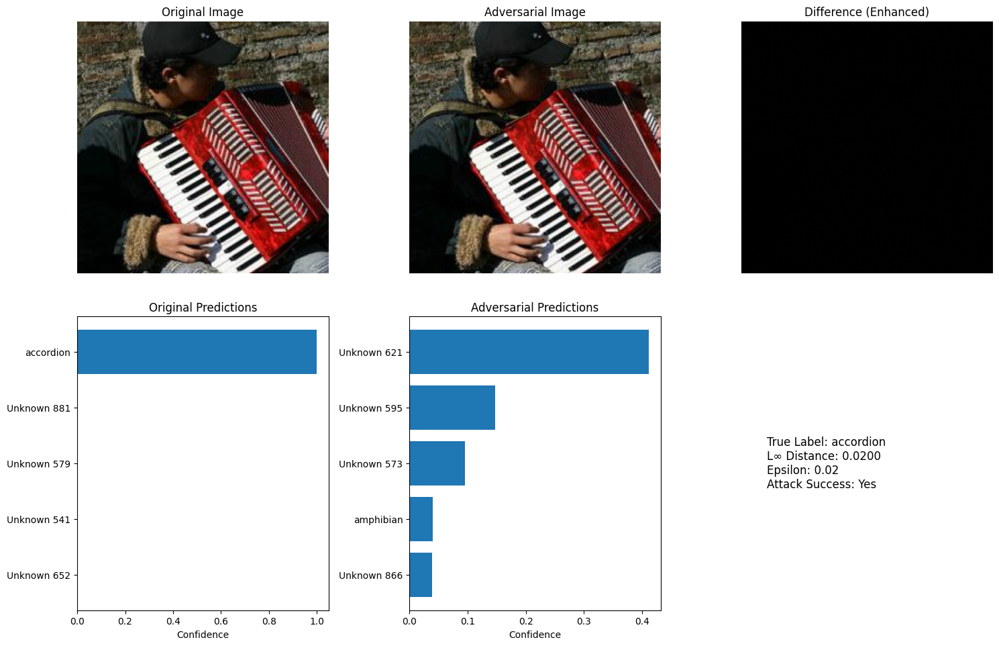


I-FGSM Successful Attack 2:


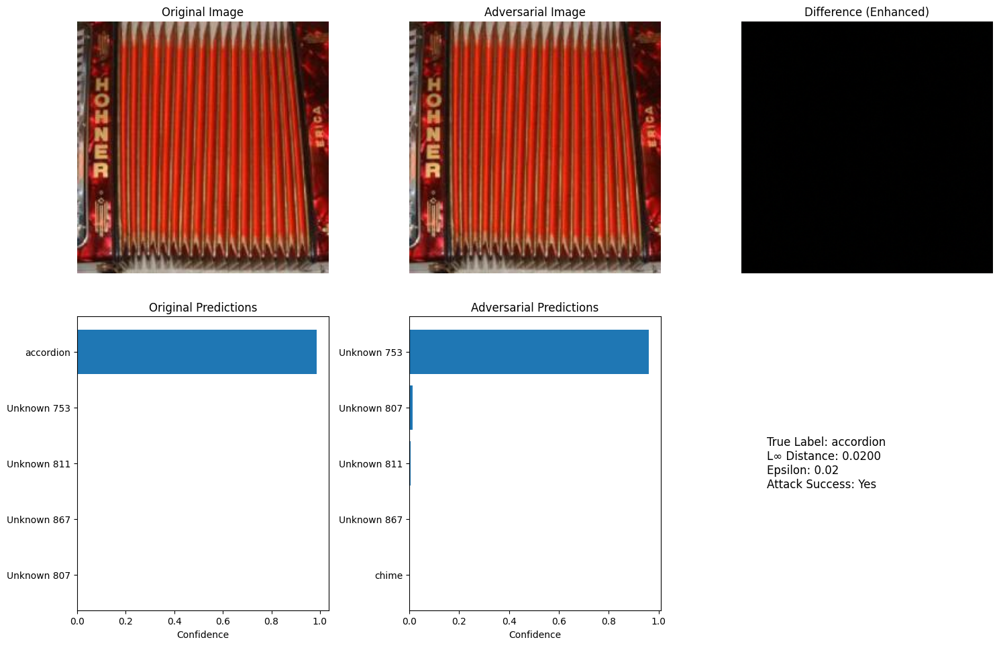


I-FGSM Successful Attack 3:


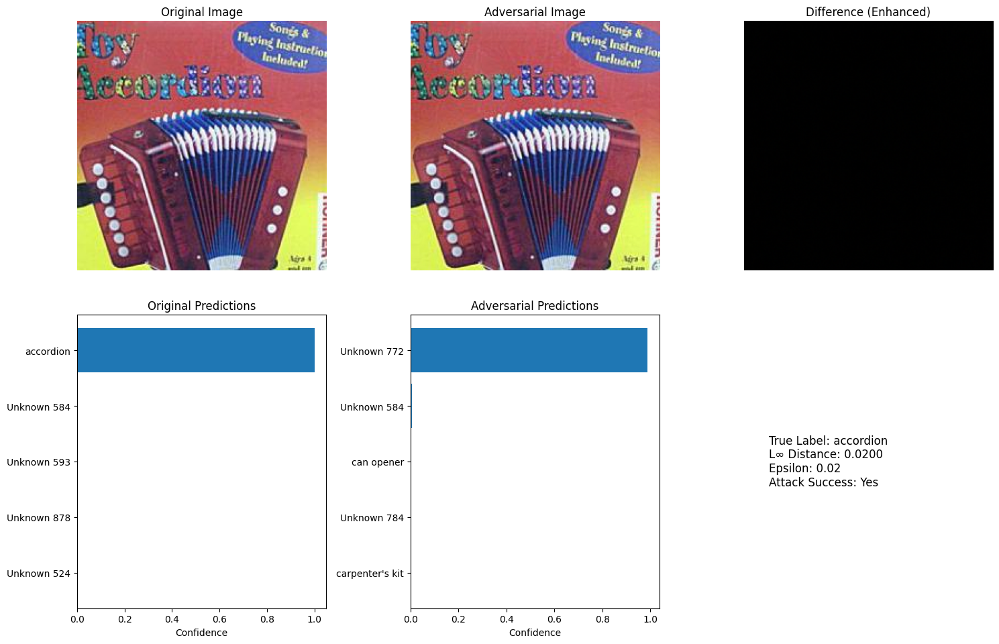


I-FGSM Successful Attack 4:


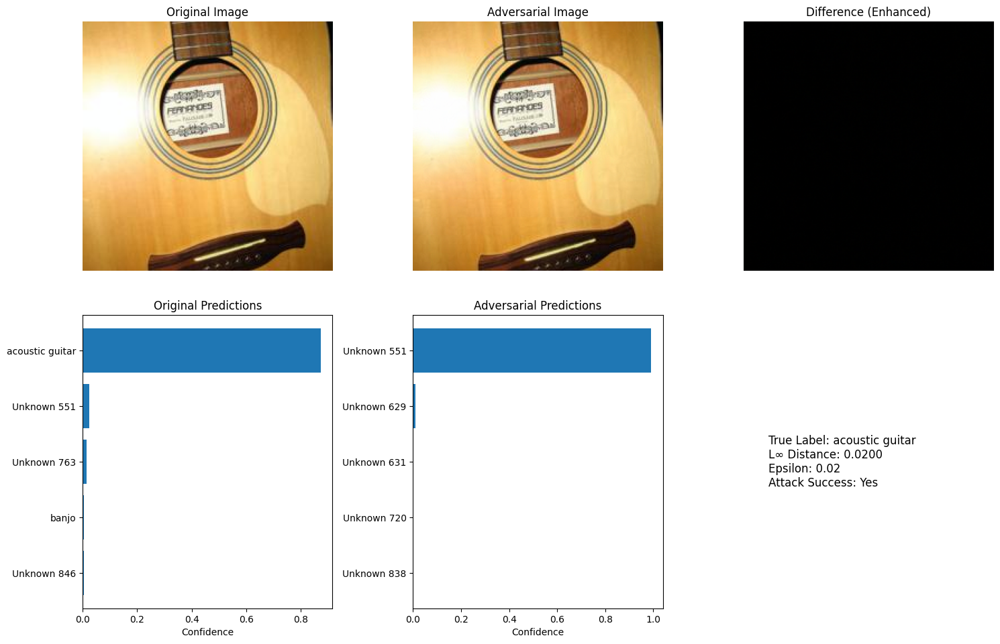


I-FGSM Successful Attack 5:


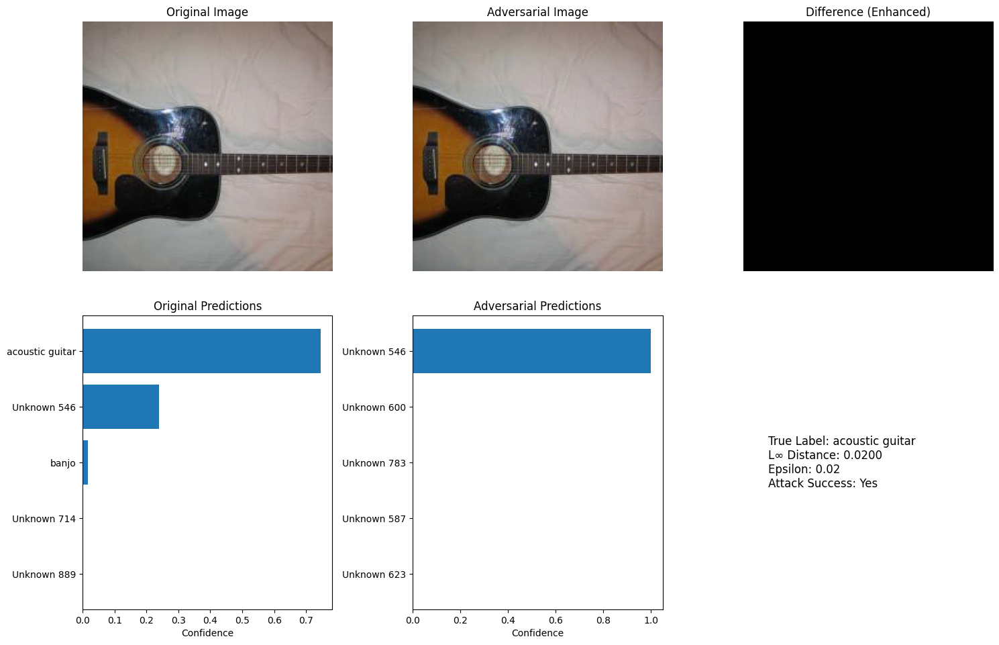

In [29]:
# Visualize up to 5 successful attacks from Adversarial Test Set 2
successful_attacks = 0
for i in range(len(adv_images2)):
    if successful_attacks >= 5:
        break

    with torch.no_grad():
        orig_pred = pretrained_model(orig_images2[i].unsqueeze(0).to(device)).argmax(dim=1)
        adv_pred = pretrained_model(adv_images2[i].unsqueeze(0).to(device)).argmax(dim=1)

    if orig_pred != adv_pred:
        successful_attacks += 1
        print(f"\nI-FGSM Successful Attack {successful_attacks}:")
        visualize_fgsm_attack(orig_images2[i], adv_images2[i].cpu(),
                              torch.tensor(adv_labels2[i]), pretrained_model, imagenet_label_map)

# **TASK 4**

Patch-based I-FGSM Attack

In [30]:
def patch_attack(model, image, label, epsilon=0.5, alpha=0.05, iters=10, patch_size=64):
    """
    Perform patch-based I-FGSM attack on a random 64x64 region of the image
    """
    image = image.clone().detach().to(device)
    ori_image = image.clone().detach()
    label = label.to(device)

    _, _, h, w = image.shape
    x_start = np.random.randint(0, w - patch_size)
    y_start = np.random.randint(0, h - patch_size)

    for _ in range(iters):
        image = image.detach().requires_grad_()

        output = model(image)
        loss = torch.nn.CrossEntropyLoss()(output, label)
        model.zero_grad()
        loss.backward()

        if image.grad is None:
            raise RuntimeError("image.grad is None. Check requires_grad setup.")

        grad = image.grad

        # Apply gradient only within patch
        patch_grad = torch.zeros_like(image)
        patch_grad[:, :, y_start:y_start+patch_size, x_start:x_start+patch_size] = \
            grad[:, :, y_start:y_start+patch_size, x_start:x_start+patch_size].sign()

        image = image + alpha * patch_grad
        image = torch.max(torch.min(image, ori_image + epsilon), ori_image - epsilon)
        image = torch.clamp(image, -2.1179, 2.6400)

    return image.detach()

In [31]:
def generate_patch_adversarial_dataset(model, dataloader, dataset_to_imagenet, epsilon=0.5, alpha=0.05, iters=10):
    adv_images = []
    adv_labels = []
    orig_images = []

    print("Generating patch-based adversarial examples...")
    for batch_idx, (images, labels) in enumerate(dataloader):
        images = images.to(device)
        labels = labels.to(device)
        true_imagenet_labels = torch.tensor([dataset_to_imagenet[label.item()] for label in labels]).to(device)

        for i in range(len(images)):
            adv_img = patch_attack(model, images[i:i+1], true_imagenet_labels[i:i+1],
                                   epsilon=epsilon, alpha=alpha, iters=iters)
            adv_images.append(adv_img.squeeze(0))
            adv_labels.append(true_imagenet_labels[i].item())
            orig_images.append(images[i].cpu())

        if batch_idx % 5 == 0:
            print(f"Processed {batch_idx}/{len(dataloader)} batches")

    return adv_images, adv_labels, orig_images

In [32]:
# Generate patch-perturbed adversarial test set
adv_images3, adv_labels3, orig_images3 = generate_patch_adversarial_dataset(
    pretrained_model, test_loader, dataset_to_imagenet, epsilon=0.5, alpha=0.05, iters=10
)

# Wrap and evaluate
adv_dataset3 = AdversarialDataset(adv_images3, adv_labels3)
adv_loader3 = torch.utils.data.DataLoader(adv_dataset3, batch_size=32, shuffle=False)

adv3_top1, adv3_top5 = evaluate_adversarial_performance(pretrained_model, adv_loader3, imagenet_label_map, k=5)

print(f"\nPatch Attack Accuracy Drop:")
print(f"Top-1: {top1_acc:.2f}% → {adv3_top1:.2f}% (Drop: {top1_acc - adv3_top1:.2f}%)")
print(f"Top-5: {top5_acc:.2f}% → {adv3_top5:.2f}% (Drop: {top5_acc - adv3_top5:.2f}%)")

Generating patch-based adversarial examples...
Processed 0/16 batches
Processed 5/16 batches
Processed 10/16 batches
Processed 15/16 batches

Adversarial Performance:
Top-1 Accuracy: 9.00%
Top-5 Accuracy: 49.00%

Patch Attack Accuracy Drop:
Top-1: 76.00% → 9.00% (Drop: 67.00%)
Top-5: 94.20% → 49.00% (Drop: 45.20%)


Adversarial dataset saved to ./AdversarialTestSet3

Patch Attack Successful 1:


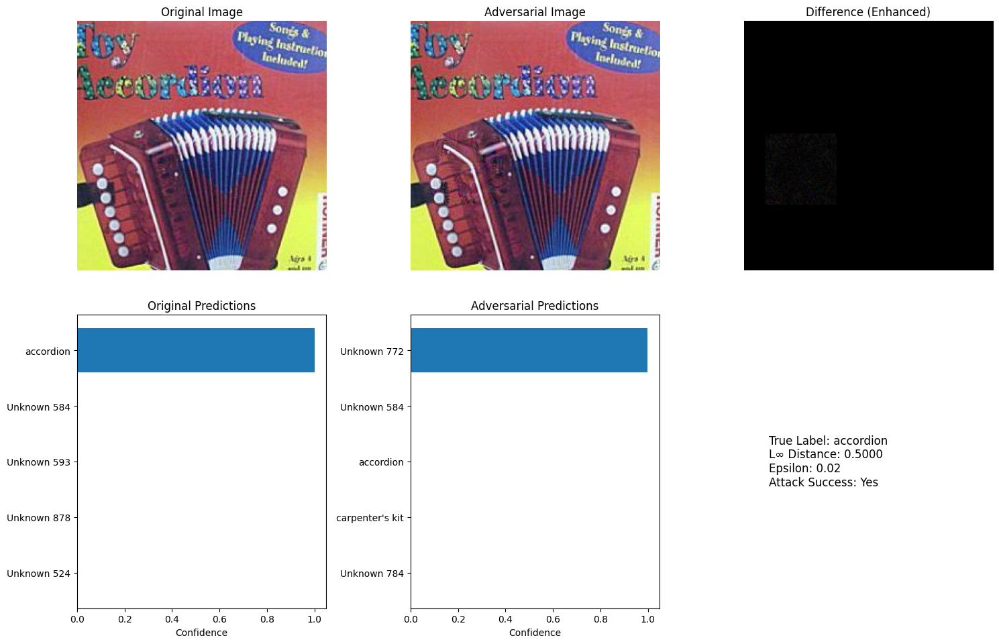


Patch Attack Successful 2:


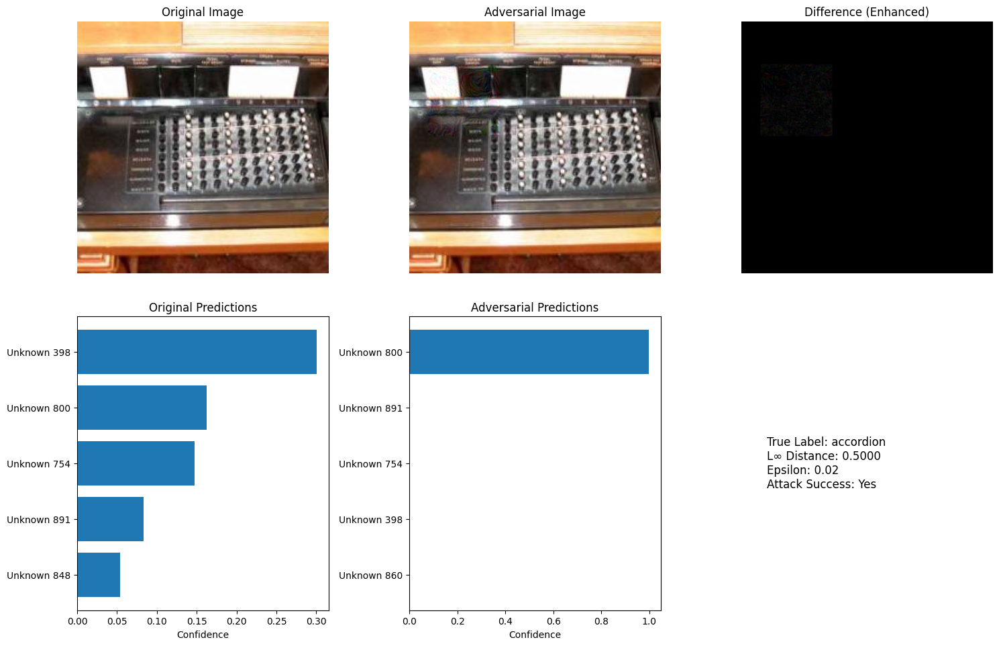


Patch Attack Successful 3:


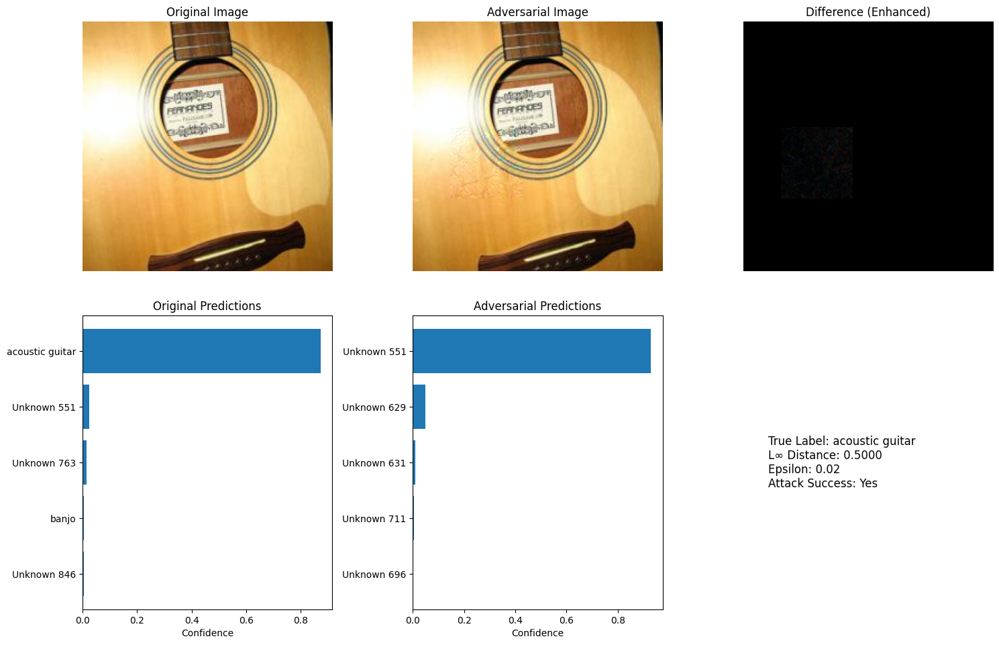


Patch Attack Successful 4:


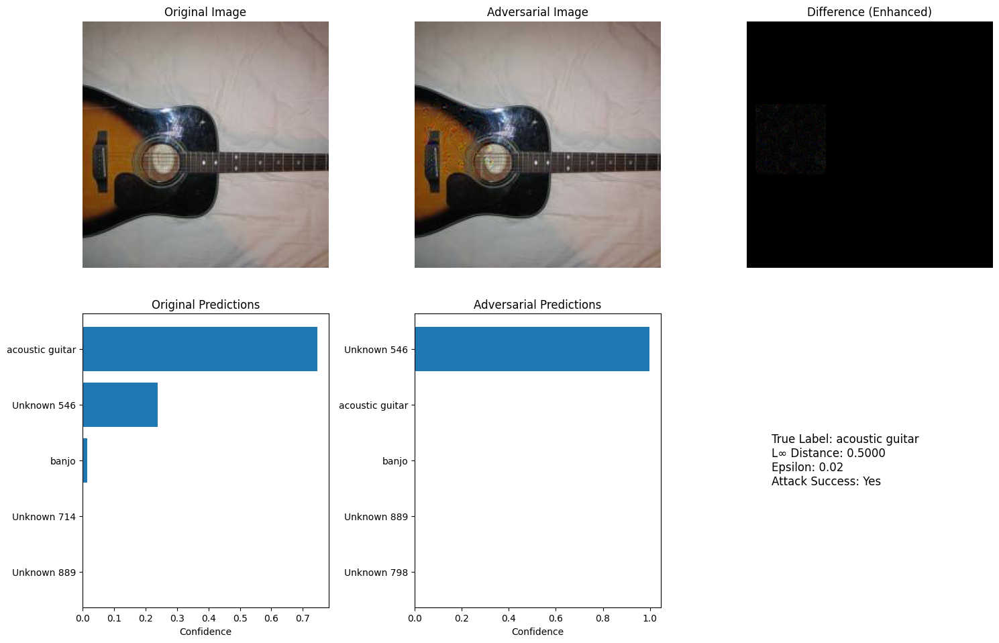


Patch Attack Successful 5:


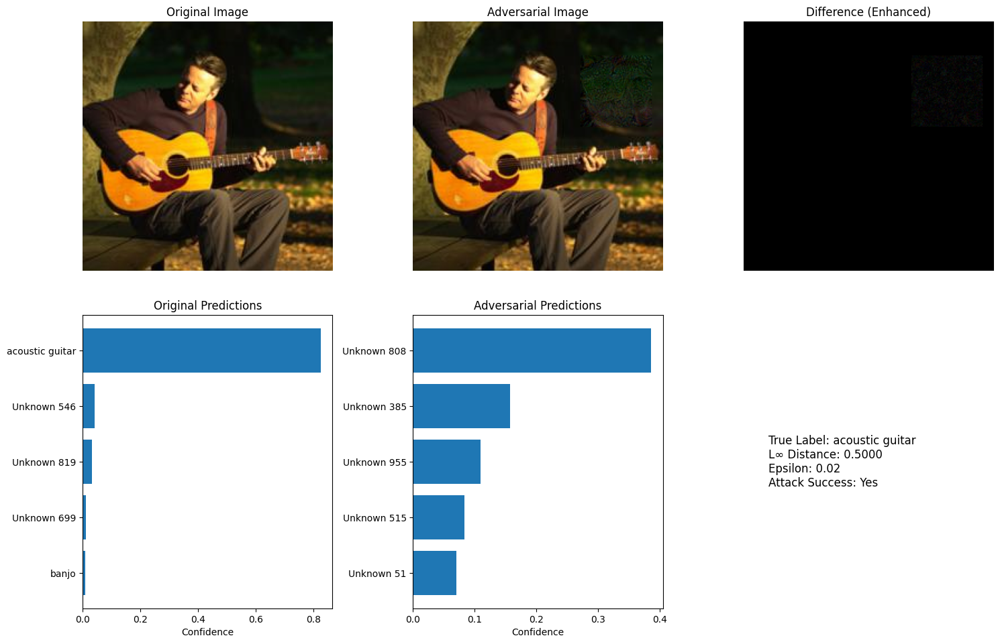

In [33]:
# Save
save_adversarial_dataset(adv_images3, adv_labels3, "./AdversarialTestSet3")

# Visualize 3–5 successful examples
successful_attacks = 0
for i in range(len(adv_images3)):
    if successful_attacks >= 5:
        break
    orig_pred = pretrained_model(orig_images3[i].unsqueeze(0).to(device)).argmax(dim=1)
    adv_pred = pretrained_model(adv_images3[i].unsqueeze(0).to(device)).argmax(dim=1)

    if orig_pred != adv_pred:
        successful_attacks += 1
        print(f"\nPatch Attack Successful {successful_attacks}:")
        visualize_fgsm_attack(orig_images3[i], adv_images3[i].cpu(),
                              torch.tensor(adv_labels3[i]), pretrained_model, imagenet_label_map)

# **TASK 4 with PGD**

Using PGD instead of i-FSGM

In [34]:
# Utilities: ImageNet channel-wise min / max in normalized space
_imnet_mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(device)
_imnet_std  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(device)
PIX_MIN = ((0 - _imnet_mean) / _imnet_std)   # [-2.1179, -2.0357, -1.8044]
PIX_MAX = ((1 - _imnet_mean) / _imnet_std)   # [ 2.2489,  2.4286,  2.6400]


# Patch-restricted PGD (multi-restart)
def patch_attack(model, images, labels,
                 epsilon=0.5, alpha=0.05, iters=10,
                 patch_size=64, n_restarts=3, targeted=False, target_class=None):
    """
    PGD attack constrained to a single square patch of size `patch_size`.
    images  : [N,3,H,W] normalized inputs
    labels  : [N]       correct ImageNet indices
    """
    N, _, H, W = images.shape
    images = images.clone().detach().to(device)
    labels = labels.to(device)

    # Track worst-case adversarial per image
    best_adv  = images.clone()
    max_loss  = torch.full((N,), -1e9, device=device)

    criterion = torch.nn.CrossEntropyLoss(reduction='none')

    for _ in range(n_restarts):
        # ---- random patch per image ----
        top   = torch.randint(0, H - patch_size + 1, (N,), device=device)
        left  = torch.randint(0, W - patch_size + 1, (N,), device=device)

        # create binary masks: 1 inside patch, 0 elsewhere
        mask = torch.zeros_like(images)
        for i in range(N):
            mask[i, :, top[i]:top[i]+patch_size, left[i]:left[i]+patch_size] = 1.0

        # random start inside epsilon-ball, but only within patch
        adv = images + torch.empty_like(images).uniform_(-epsilon, epsilon) * mask
        adv = torch.max(torch.min(adv, PIX_MAX), PIX_MIN).detach()
        adv.requires_grad = True

        for _ in range(iters):
            outputs = model(adv)
            if targeted:
                # maximise probability of `target_class`
                tgt = torch.full_like(labels, target_class)
                loss = -criterion(outputs, tgt)
            else:
                # untargeted: maximise loss w.r.t. true label
                loss = criterion(outputs, labels)

            loss = loss.mean()
            model.zero_grad()
            loss.backward()

            grad_sign = adv.grad.sign()
            adv = adv + alpha * grad_sign * mask  # update only inside patch

            # project perturbation back to epsilon-ball (inside patch)
            eta = torch.clamp(adv - images, min=-epsilon, max=epsilon)
            adv = images + eta * mask + images * (1 - mask)  # keep outside pixels exact
            adv = torch.max(torch.min(adv, PIX_MAX), PIX_MIN).detach()
            adv.requires_grad = True

        # evaluate and keep stronger adversary
        with torch.no_grad():
            out  = model(adv)
            cur_loss = criterion(out, labels) if not targeted else -criterion(out, torch.full_like(labels, target_class))
        better = cur_loss > max_loss
        max_loss[better] = cur_loss[better]
        best_adv[better] = adv[better]

    return best_adv.detach()

In [35]:
def generate_patch_adversarial_dataset(model, dataloader, dataset_to_imagenet,
                                       epsilon=0.5, alpha=0.05, iters=10,
                                       patch_size=64, n_restarts=3):
    model.eval()
    adv_images, adv_labels, orig_images = [], [], []

    print("Generating patch-based adversarial examples…")
    for batch_idx, (images, labels) in enumerate(dataloader):
        images = images.to(device)
        labels = torch.tensor(
            [dataset_to_imagenet[l.item()] for l in labels],
            dtype=torch.long, device=device
        )

        # apply attack to whole mini-batch in one call
        adv_batch = patch_attack(model, images, labels,
                                 epsilon=epsilon, alpha=alpha, iters=iters,
                                 patch_size=patch_size, n_restarts=n_restarts)

        adv_images.extend(adv_batch.cpu())
        adv_labels.extend(labels.cpu().tolist())
        orig_images.extend(images.cpu())

        if batch_idx % 5 == 0:
            print(f"Processed {batch_idx}/{len(dataloader)} batches")

    return adv_images, adv_labels, orig_images

In [36]:
adv_images3, adv_labels3, orig_images3 = generate_patch_adversarial_dataset(
    pretrained_model, test_loader, dataset_to_imagenet,
    epsilon=0.5,   # larger ε permitted for patch attack
    alpha=0.05,
    iters=10,
    patch_size=64,
    n_restarts=3
)

# Wrap & evaluate
adv_dataset3 = AdversarialDataset(adv_images3, adv_labels3)
adv_loader3  = torch.utils.data.DataLoader(adv_dataset3, batch_size=32, shuffle=False)

adv3_top1, adv3_top5 = evaluate_adversarial_performance(
    pretrained_model, adv_loader3, imagenet_label_map, k=5
)

print(f"\nPatch-Attack Accuracy Drop (64×64 patch):")
print(f"Top-1: {top1_acc:.2f}% → {adv3_top1:.2f}% (Drop: {top1_acc - adv3_top1:.2f}%)")
print(f"Top-5: {top5_acc:.2f}% → {adv3_top5:.2f}% (Drop: {top5_acc - adv3_top5:.2f}%)")

Generating patch-based adversarial examples…
Processed 0/16 batches
Processed 5/16 batches
Processed 10/16 batches
Processed 15/16 batches

Adversarial Performance:
Top-1 Accuracy: 1.60%
Top-5 Accuracy: 27.20%

Patch-Attack Accuracy Drop (64×64 patch):
Top-1: 76.00% → 1.60% (Drop: 74.40%)
Top-5: 94.20% → 27.20% (Drop: 67.00%)


Adversarial dataset saved to ./AdversarialTestSet3

Patch Attack Successful 1:


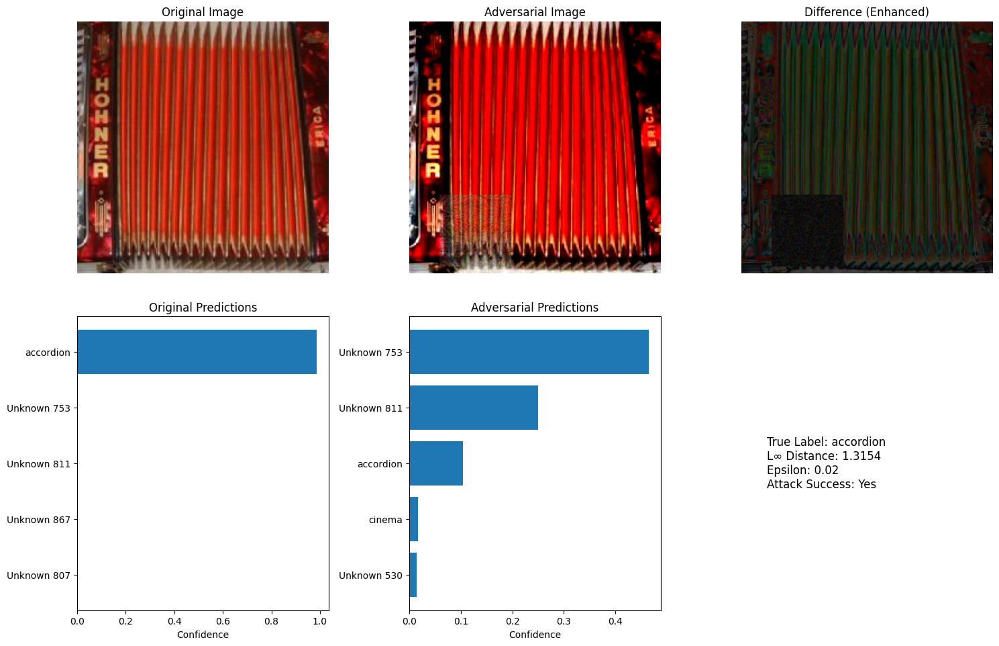


Patch Attack Successful 2:


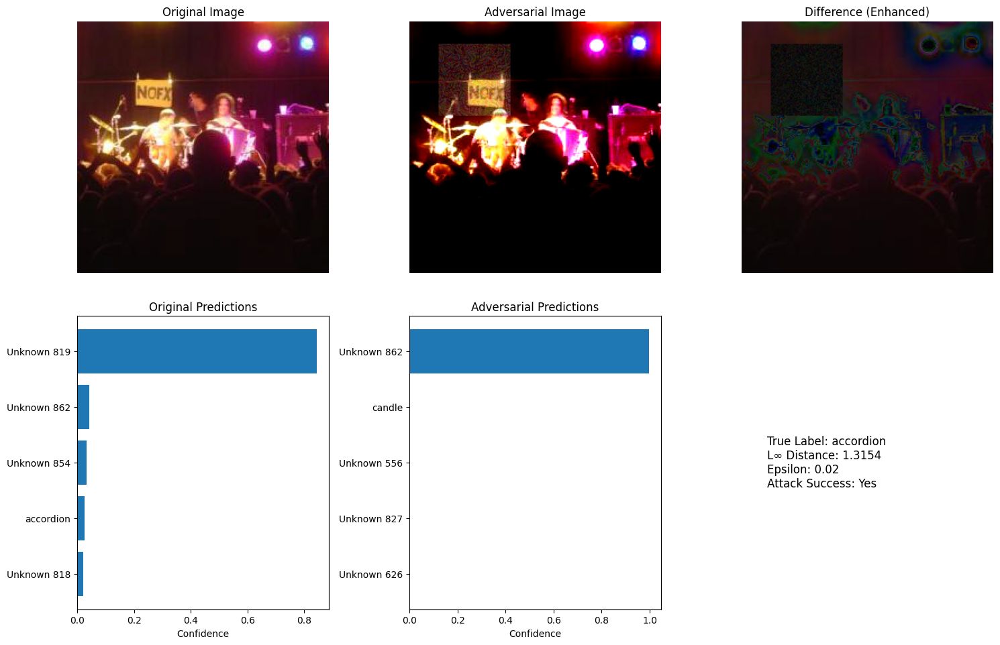


Patch Attack Successful 3:


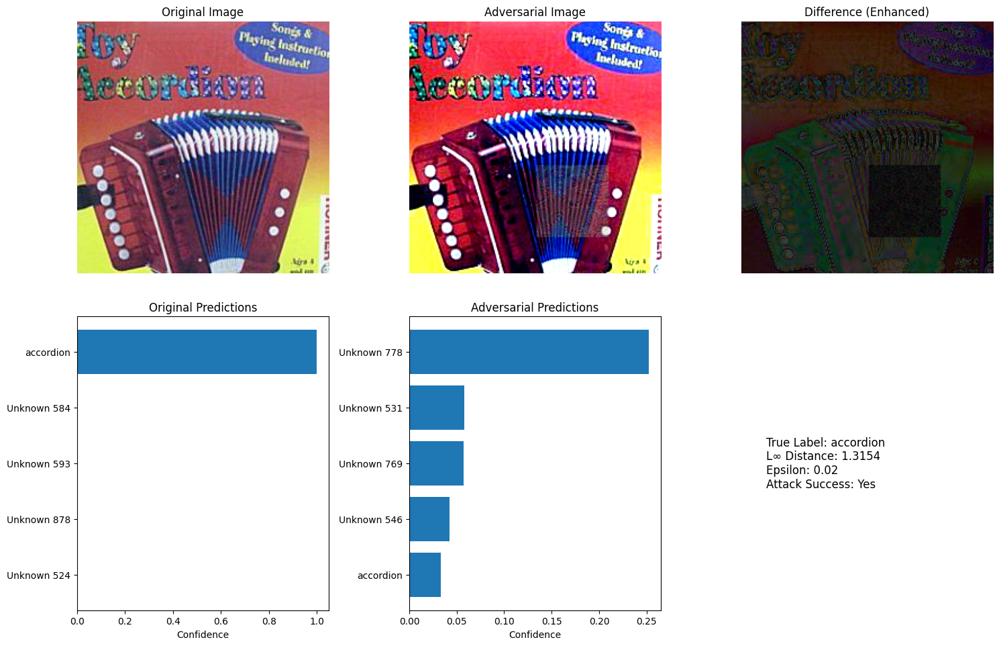


Patch Attack Successful 4:


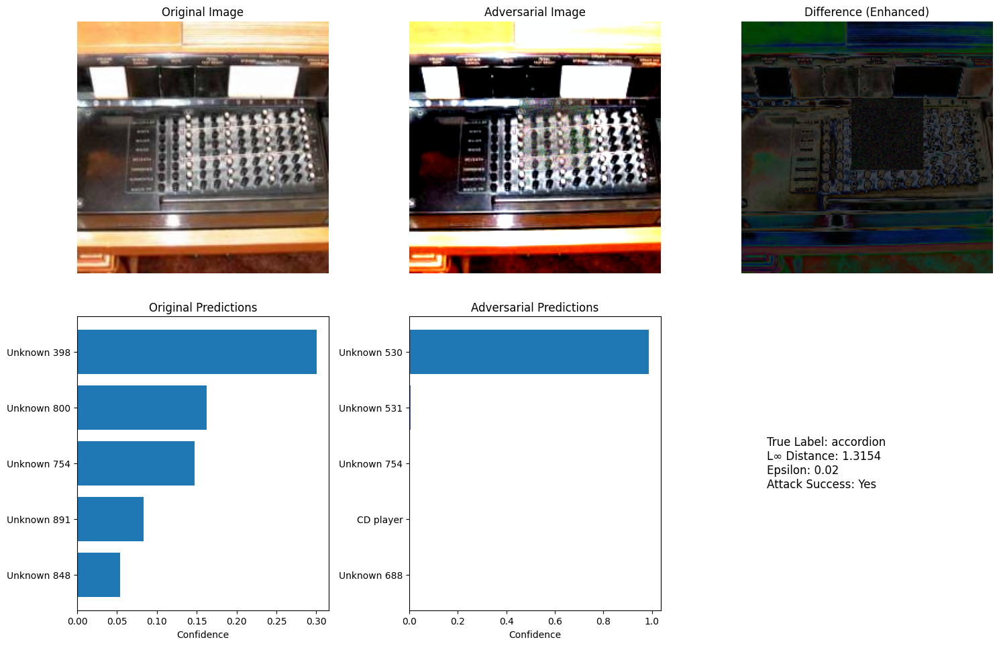


Patch Attack Successful 5:


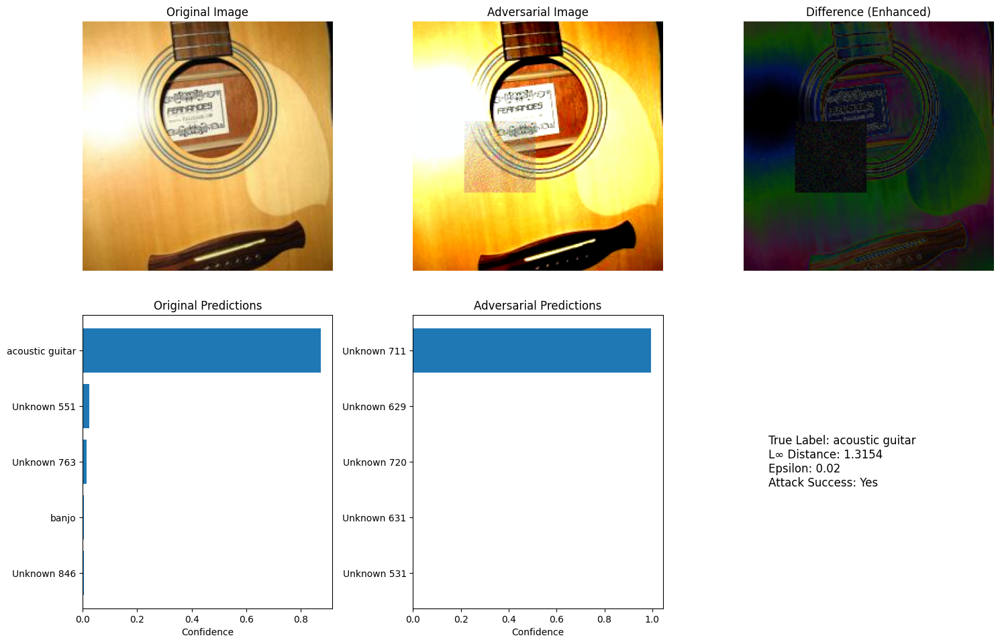

In [37]:
# Save
save_adversarial_dataset(adv_images3, adv_labels3, "./AdversarialTestSet3")

# Visualize 3–5 successful examples
successful_attacks = 0
for i in range(len(adv_images3)):
    if successful_attacks >= 5:
        break
    orig_pred = pretrained_model(orig_images3[i].unsqueeze(0).to(device)).argmax(dim=1)
    adv_pred = pretrained_model(adv_images3[i].unsqueeze(0).to(device)).argmax(dim=1)

    if orig_pred != adv_pred:
        successful_attacks += 1
        print(f"\nPatch Attack Successful {successful_attacks}:")
        visualize_fgsm_attack(orig_images3[i], adv_images3[i].cpu(),
                              torch.tensor(adv_labels3[i]), pretrained_model, imagenet_label_map)

# **TASK 5**

In [38]:
# Load new model for transferability evaluation
new_model = torchvision.models.densenet121(weights='IMAGENET1K_V1').to(device)
new_model.eval()
print("Using DenseNet-121 for transferability evaluation.")

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 200MB/s]


Using DenseNet-121 for transferability evaluation.


In [39]:
# Evaluate on original test set
print("\nOriginal Test Set:")
transfer_top1_orig, transfer_top5_orig = evaluate_model(
    new_model, test_loader, imagenet_label_map, dataset_to_imagenet, k=5
)

# Evaluate FGSM (Adversarial Test Set 1)
print("\nAdversarial Test Set 1 (FGSM):")
transfer_top1_adv1, transfer_top5_adv1 = evaluate_adversarial_performance(
    new_model, adv_loader, imagenet_label_map, k=5
)

# Evaluate PGD (Adversarial Test Set 2)
print("\nAdversarial Test Set 2 (PGD):")
transfer_top1_adv2, transfer_top5_adv2 = evaluate_adversarial_performance(
    new_model, adv_loader2, imagenet_label_map, k=5
)

# Evaluate Patch Attack (Adversarial Test Set 3)
print("\nAdversarial Test Set 3 (Patch Attack):")
transfer_top1_adv3, transfer_top5_adv3 = evaluate_adversarial_performance(
    new_model, adv_loader3, imagenet_label_map, k=5
)


Original Test Set:
Top-1 Accuracy: 74.80%
Top-5 Accuracy: 93.60%

Adversarial Test Set 1 (FGSM):

Adversarial Performance:
Top-1 Accuracy: 63.40%
Top-5 Accuracy: 89.20%

Adversarial Test Set 2 (PGD):

Adversarial Performance:
Top-1 Accuracy: 65.20%
Top-5 Accuracy: 91.20%

Adversarial Test Set 3 (Patch Attack):

Adversarial Performance:
Top-1 Accuracy: 60.40%
Top-5 Accuracy: 83.40%


In [46]:
# For FGSM
adv_images1, adv_labels1, original_images1 = generate_adversarial_dataset(
    pretrained_model, test_loader, imagenet_label_map, dataset_to_imagenet,
    epsilon=0.02
)

# For PGD or I-FGSM
adv_images2, adv_labels2, orig_images2 = generate_iterative_adversarial_dataset(
    pretrained_model, test_loader, imagenet_label_map, dataset_to_imagenet,
    epsilon=0.02, iters=5
)

# For Patch Attack
adv_images3, adv_labels3, orig_images3 = generate_patch_adversarial_dataset(
    pretrained_model, test_loader, dataset_to_imagenet,
    epsilon=0.02, iters=10, patch_size=32, n_restarts=3
)

Generating adversarial examples...
Processed 0/16 batches
Processed 5/16 batches
Processed 10/16 batches
Processed 15/16 batches
Processed 0/16 batches
Processed 5/16 batches
Processed 10/16 batches
Processed 15/16 batches
Generating patch-based adversarial examples…
Processed 0/16 batches
Processed 5/16 batches
Processed 10/16 batches
Processed 15/16 batches


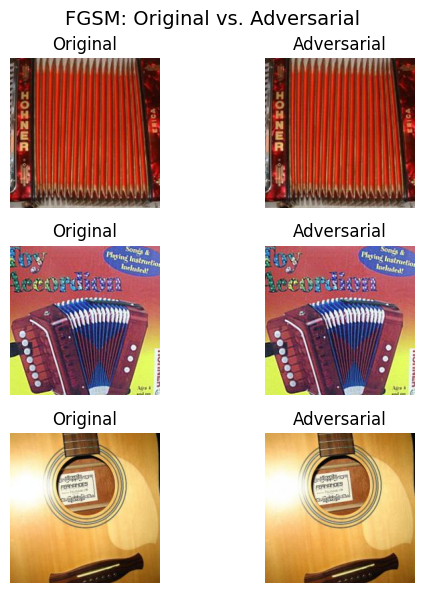

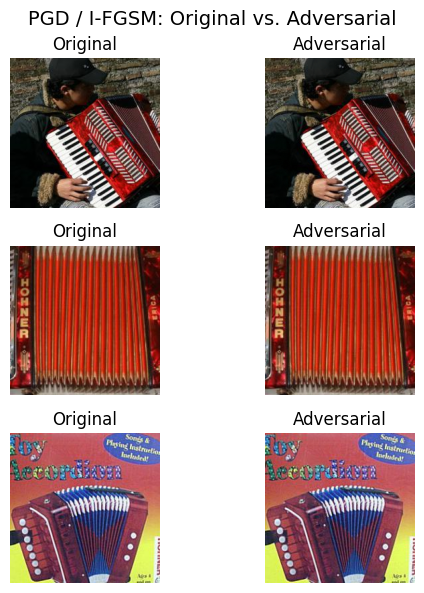

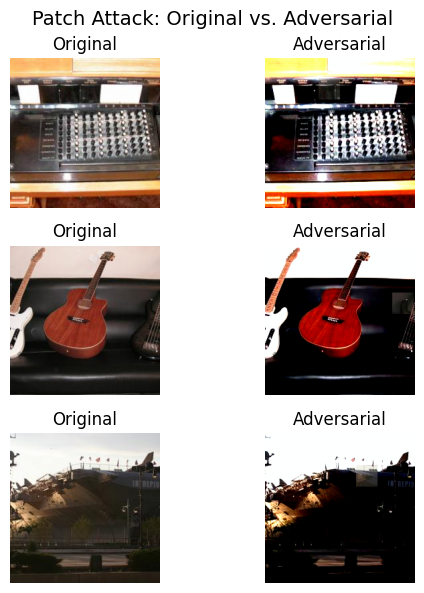

In [47]:
import matplotlib.pyplot as plt
import numpy as np
import torch

# Denormalization for visualization
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

def denormalize(tensor):
    img = tensor.permute(1, 2, 0).cpu().numpy()
    img = std * img + mean
    return np.clip(img, 0, 1)

def find_successful_indices(orig_imgs, adv_imgs, model, max_examples=3):
    successful_indices = []
    for i in range(len(adv_imgs)):
        orig_pred = model(orig_imgs[i].unsqueeze(0).to(device)).argmax(dim=1).item()
        adv_pred = model(adv_imgs[i].unsqueeze(0).to(device)).argmax(dim=1).item()
        if orig_pred != adv_pred:
            successful_indices.append(i)
        if len(successful_indices) >= max_examples:
            break
    return successful_indices

def plot_comparisons(orig_imgs, adv_imgs, indices, attack_name):
    fig, axes = plt.subplots(nrows=len(indices), ncols=2, figsize=(6, 6))
    fig.suptitle(f"{attack_name}: Original vs. Adversarial", fontsize=14)

    for row, idx in enumerate(indices):
        orig_img = denormalize(orig_imgs[idx])
        adv_img = denormalize(adv_imgs[idx])

        axes[row, 0].imshow(orig_img)
        axes[row, 0].set_title("Original")
        axes[row, 0].axis('off')

        axes[row, 1].imshow(adv_img)
        axes[row, 1].set_title("Adversarial")
        axes[row, 1].axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

# Run for all attacks (replace with actual variable names from your notebook)
for attack_name, orig_imgs, adv_imgs in [
    ("FGSM", original_images1, adv_images1),
    ("PGD / I-FGSM", orig_images2, adv_images2),
    ("Patch Attack", orig_images3, adv_images3)
]:
    indices = find_successful_indices(orig_imgs, adv_imgs, pretrained_model)
    if indices:
        plot_comparisons(orig_imgs, adv_imgs, indices, attack_name)
    else:
        print(f"No successful adversarial examples found for {attack_name}.")
